In [2]:
import cv2
import numpy as np
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
import matplotlib.path as path
import matplotlib.patches as patches
from scipy.sparse import csc_matrix
from scipy.sparse import linalg
from scipy.linalg import solve
from matplotlib.widgets import PolygonSelector

# Region Filling

In [3]:
raw_img = cv2.imread("img.jpg", cv2.IMREAD_COLOR)
img_gray = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_gray = img_gray.astype(np.float32) / 255.

In [4]:
def mark_vertices(img):
    vertex = []

    %matplotlib widget 
    plt.rcParams["keymap.quit"] = "q"
    fig = plt.figure()
    plt.imshow(img, cmap='gray')
    def onclick(event):
        x, y = int(event.xdata), int(event.ydata)
        vertex.append([x, y])
        plt.scatter(x, y)
        fig.canvas.draw()

    cid = fig.canvas.mpl_connect('button_press_event', onclick)
    plt.show()
    return vertex

In [5]:
def visualzie_ploy(img, vertex):
    %matplotlib inline 
    plt.imshow(img, cmap='gray')
    #vertex = [[170, 25],[250, 25],[240,100],[200,110],[170, 100],[160, 70]]
    polygon = plt.Polygon(vertex, edgecolor='r', facecolor='none')
    plt.gca().add_patch(polygon)

In [24]:
def region_fill(img, vertex):
    upper_lt = np.min(vertex, axis=0)
    lower_rt = np.max(vertex, axis=0)
    polygon = plt.Polygon(vertex)
    region = []
    boundary = []

    # loop over the boundary box of marked region
    for i in range(upper_lt[1], lower_rt[1]+1):
        for j in range(upper_lt[0], lower_rt[0]+1):
            # current pixel
            point = np.array([j, i]).reshape(2, 1)
            # four connecting neighbors of the current pixel
            n = [[j, i-1], [j, i+1], [j-1, i], [j+1, i]]

            # if pixel is inside region
            if polygon.contains_point(point):
                # record index to list of points inside region
                region.append([i, j])

                # check each neighbor of the current pixel
                for neighbor in n:
                    neighbor_point = np.array(neighbor).reshape(2, 1)
                    # if neighbor not in region, mark it as a boundary pixel
                    if not polygon.contains_point(neighbor_point):
                        boundary.append([neighbor[1], neighbor[0]])

    # creates a correspondence between region pixels in a 1d vector and region pixels in the img coords
    region_map = np.ones(img.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not in region
    region_map = -region_map
    for idx in range(len(region)):
        i, j = region[idx]
        # image coords as key, index in 1d vector as values
        region_map[i, j] = idx

    # creates a correspondence between boundary pixels in a 1d vector and region pixels in the img coords
    boundary_map = np.ones(img.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not on boundary
    boundary_map = -boundary_map
    for idx in range(len(boundary)):
        i, j = boundary[idx]
        # image coords as key, index in 1d vector as values
        boundary_map[i, j] = idx


    region = np.array(region)
    length = region.shape[0]
    A = np.zeros([length,length])
    b = np.zeros([length, 1])

    for idx in range(length):
        i, j = region[idx]
        # setting diagonals of the A matrix 
        A[idx, idx] = 4

        # four connecting neighbors of the current pixel
        neighbors = [[i, j-1], [i, j+1], [i-1, j], [i+1, j]]

        for neighbor in neighbors:
            n_i, n_j = neighbor
            # find the neighbor pixel's index in the 1d vector for region pixels
            region_idx = region_map[n_i, n_j]
            # if neighbor pixel is inside the region
            if region_idx > -1:
                # fill in the rows of the A matrix
                A[idx, region_idx] = -1

            boundary_idx = boundary_map[n_i, n_j]
            if boundary_idx > -1:
                b[idx] = b[idx] + img[n_i, n_j]
                
    a = csc_matrix(A)
    x = linalg.spsolve(a, b)

    new_img = img.copy()
    counter = 0
    for pxl in region:
        i, j = pxl
        new_img[i, j] = max(0.0, min(x[counter], 1.0))
        counter += 1
    
    return new_img

In [27]:
def plot_imgs(before, after, vertex):
    %matplotlib inline 
    fig, ax = plt.subplots(1,2,figsize=(15,10))
    ax[0].imshow(before, cmap='gray', vmin=0, vmax=1)
    polygon = plt.Polygon(vertex, edgecolor='r', facecolor='none')
    ax[0].add_patch(polygon)
    ax[1].imshow(after, cmap='gray', vmin=0, vmax=1)

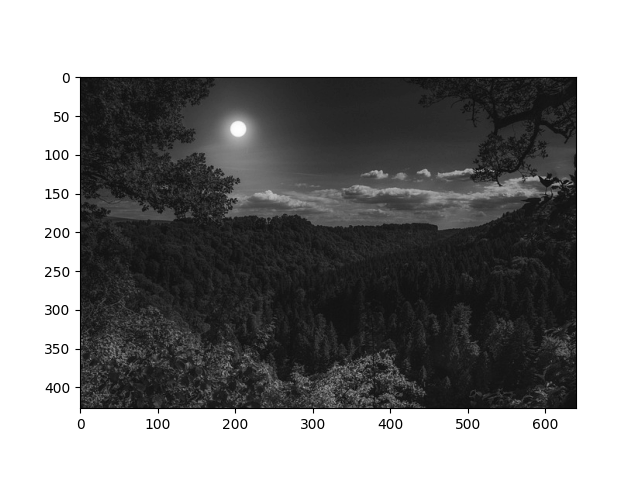

In [28]:
vertex = mark_vertices(img_gray)

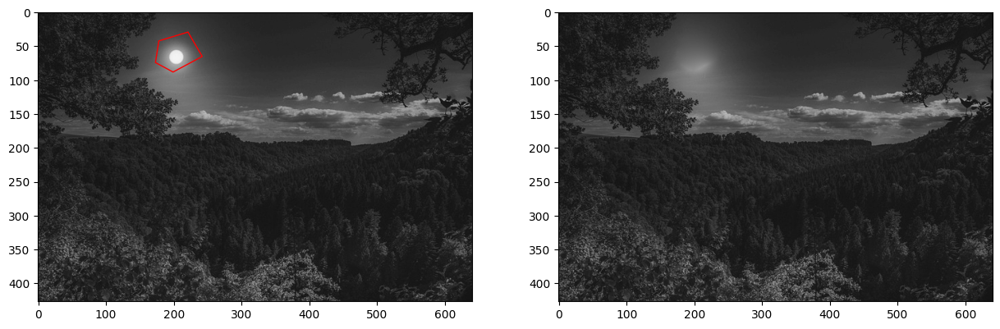

In [30]:
new_img = region_fill(img_gray, vertex)
plot_imgs(img_gray, new_img, vertex)

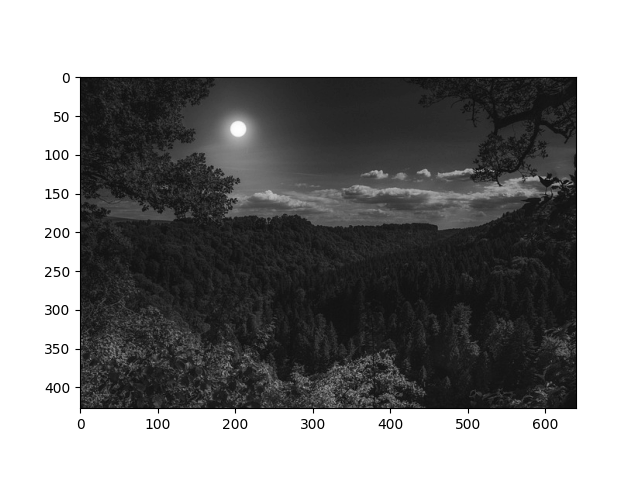

In [433]:
vertex = mark_vertices(img_gray)

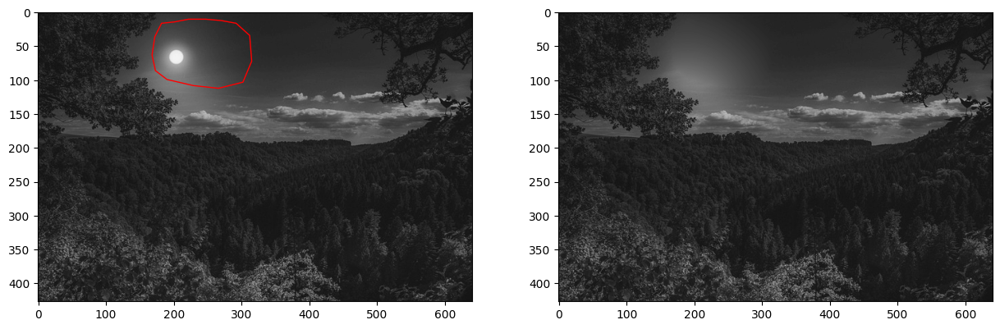

In [434]:
new_img = region_fill(img_gray, vertex)
plot_imgs(img_gray, new_img, vertex)

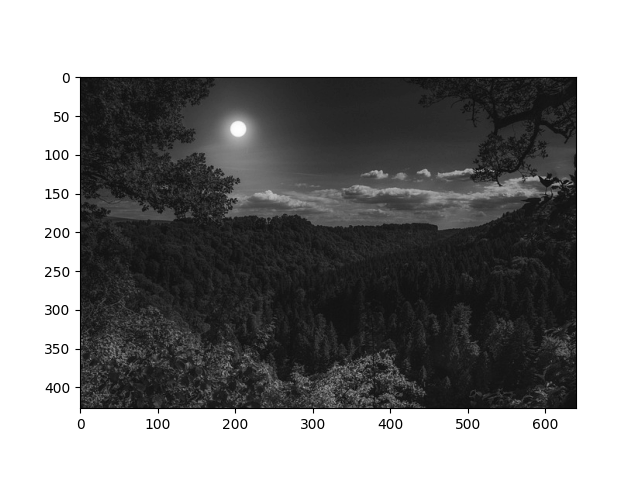

In [435]:
vertex = mark_vertices(img_gray)

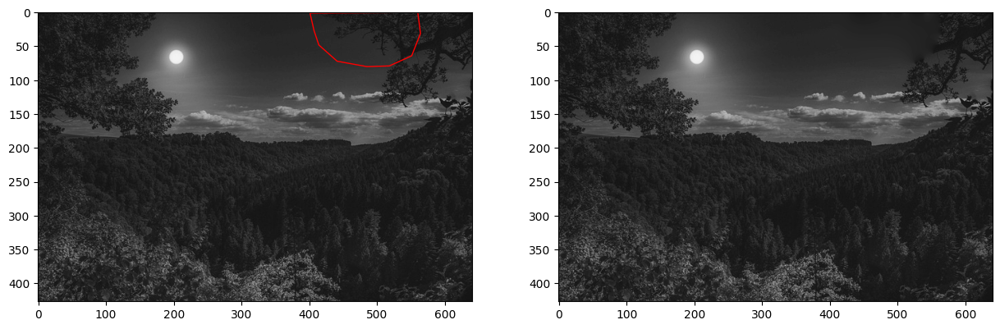

In [436]:
new_img = region_fill(img_gray, vertex)
plot_imgs(img_gray, new_img, vertex)

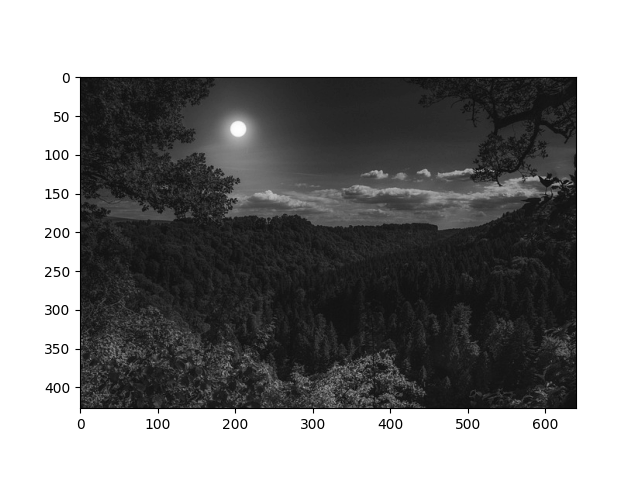

In [437]:
vertex = mark_vertices(img_gray)

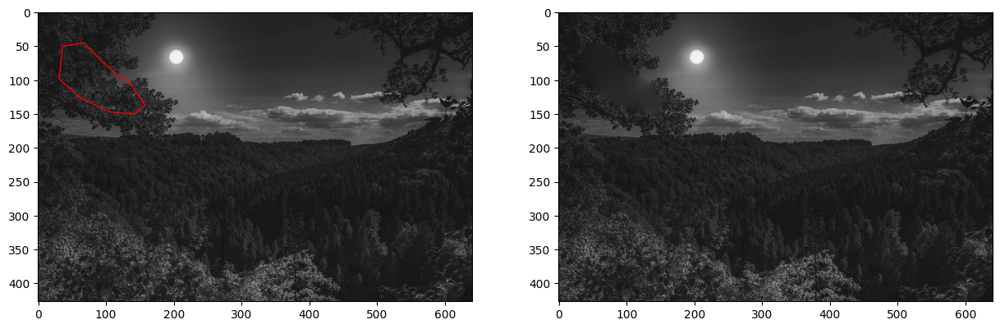

In [438]:
new_img = region_fill(img_gray, vertex)
plot_imgs(img_gray, new_img, vertex)

## Importing gradients

In [485]:
raw_img = cv2.imread("img2.jpg", cv2.IMREAD_COLOR)
img_source = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_source = img_source.astype(np.float32) / 255.

raw_img = cv2.imread("img.jpg", cv2.IMREAD_COLOR)
img_target = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_target = img_target.astype(np.float32) / 255.

In [6]:
def import_grad(source, target, offset, vertex):
    new_vertex = np.array(vertex) + offset
    upper_lt = np.min(new_vertex, axis=0)
    lower_rt = np.max(new_vertex, axis=0)
    polygon = plt.Polygon(new_vertex)
    region = []
    boundary = []

    # loop over the boundary box of marked region of destination img
    for i in range(upper_lt[1], lower_rt[1]+1):
        for j in range(upper_lt[0], lower_rt[0]+1):
            # current pixel coord in destination img
            point = np.array([j, i]).reshape(2, 1)
            # four connecting neighbors of the current pixel
            n = [[j, i-1], [j, i+1], [j-1, i], [j+1, i]]

            # if pixel is inside region in the destination img
            if polygon.contains_point(point):
                # record pixel coord of destination img
                region.append([i, j])

                # check each neighbor of the current pixel
                for neighbor in n:
                    neighbor_point = np.array(neighbor).reshape(2, 1)
                    # if neighbor not in region, mark it as a boundary pixel
                    if not polygon.contains_point(neighbor_point):
                        boundary.append([neighbor[1], neighbor[0]])

    # creates a correspondence between region pixels in a 1d vector and region pixels in the img coords
    region_map = np.ones(target.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not in region
    region_map = -region_map
    for idx in range(len(region)):
        i, j = region[idx]
        # image coords as key, index in 1d vector as values
        region_map[i, j] = idx

    # creates a correspondence between boundary pixels in a 1d vector and region pixels in the img coords
    boundary_map = np.ones(target.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not on boundary
    boundary_map = -boundary_map
    for idx in range(len(boundary)):
        i, j = boundary[idx]
        # image coords as key, index in 1d vector as values
        boundary_map[i, j] = idx


    region = np.array(region)
    length = region.shape[0]
    A = np.zeros([length,length])
    b = np.zeros([length, 1])

    for idx in range(length):
        i, j = region[idx]
        # setting diagonals of the A matrix 
        A[idx, idx] = 4

        # four connecting neighbors of the current pixel
        neighbors = [[i, j-1], [i, j+1], [i-1, j], [i+1, j]]

        for neighbor in neighbors:
            n_i, n_j = neighbor
            # find the neighbor pixel's index in the 1d vector for region pixels
            region_idx = region_map[n_i, n_j]
            # if neighbor pixel is inside the region
            if region_idx > -1:
                # fill in the rows of the A matrix
                A[idx, region_idx] = -1

            boundary_idx = boundary_map[n_i, n_j]
            if boundary_idx > -1:
                b[idx] = b[idx] + target[n_i, n_j]

            # discrete implementation for the guidance field 
            # source and destination are mapped using the offset vector
            v = source[i - offset[1], j - offset[0]] - source[n_i - offset[1], n_j - offset[0]]
            b[idx] = b[idx] + v

    # convert A to sparse matrix to speed up computation
    a = csc_matrix(A)
    # solve for unknow pixels x using Ax = b
    x = linalg.spsolve(a, b)

    # construct the new image 
    new_img = target.copy()
    counter = 0
    for pxl in region:
        i, j = pxl
        # clamp in case out of bounds
        new_img[i, j] = max(0.0, min(x[counter], 1.0))
        counter += 1
        
    return new_img

In [7]:
def plot_imgs_clone(source, target, new, vertex, offset):
    %matplotlib inline 
    fig, ax = plt.subplots(1,3,figsize=(15,10))
    ax[0].imshow(source, cmap='gray', vmin=0, vmax=1)
    polygon = plt.Polygon(vertex, edgecolor='r', facecolor='none')
    ax[0].add_patch(polygon)
    new_vertex = np.array(vertex) + offset
    ax[1].imshow(target, cmap='gray', vmin=0, vmax=1)
    polygon = plt.Polygon(new_vertex, edgecolor='r', facecolor='none')
    ax[1].add_patch(polygon)
    ax[2].imshow(new, cmap='gray', vmin=0, vmax=1)

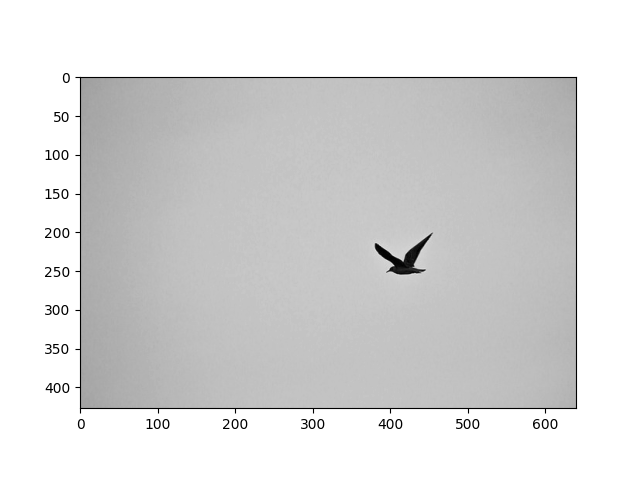

In [488]:
vertex = mark_vertices(img_source)

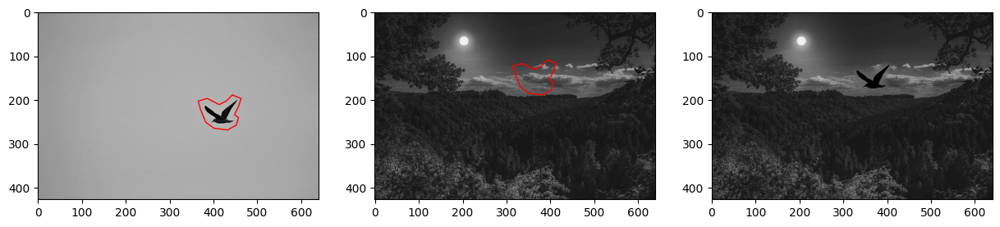

In [490]:
offset = np.array([-50, -80])
new_img_clone = import_grad(img_source, img_target, offset, vertex)
plot_imgs_clone(img_source, img_target, new_img_clone, vertex, offset)

## Mixing gradients

In [8]:
def mix_grad(source, target, offset, vertex):
    new_vertex = np.array(vertex) + offset
    upper_lt = np.min(new_vertex, axis=0)
    lower_rt = np.max(new_vertex, axis=0)
    polygon = plt.Polygon(new_vertex)
    region = []
    boundary = []

    # loop over the boundary box of marked region of destination img
    for i in range(upper_lt[1], lower_rt[1]+1):
        for j in range(upper_lt[0], lower_rt[0]+1):
            # current pixel coord in destination img
            point = np.array([j, i]).reshape(2, 1)
            # four connecting neighbors of the current pixel
            n = [[j, i-1], [j, i+1], [j-1, i], [j+1, i]]

            # if pixel is inside region in the destination img
            if polygon.contains_point(point):
                # record pixel coord of destination img
                region.append([i, j])

                # check each neighbor of the current pixel
                for neighbor in n:
                    neighbor_point = np.array(neighbor).reshape(2, 1)
                    # if neighbor not in region, mark it as a boundary pixel
                    if not polygon.contains_point(neighbor_point):
                        boundary.append([neighbor[1], neighbor[0]])

    # creates a correspondence between region pixels in a 1d vector and region pixels in the img coords
    region_map = np.ones(target.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not in region
    region_map = -region_map
    for idx in range(len(region)):
        i, j = region[idx]
        # image coords as key, index in 1d vector as values
        region_map[i, j] = idx

    # creates a correspondence between boundary pixels in a 1d vector and region pixels in the img coords
    boundary_map = np.ones(target.shape).astype(int)
    # initialize all values to -1, if -1, then pixel not on boundary
    boundary_map = -boundary_map
    for idx in range(len(boundary)):
        i, j = boundary[idx]
        # image coords as key, index in 1d vector as values
        boundary_map[i, j] = idx


    region = np.array(region)
    length = region.shape[0]
    A = np.zeros([length,length])
    b = np.zeros([length, 1])

    for idx in range(length):
        i, j = region[idx]
        # setting diagonals of the A matrix 
        A[idx, idx] = 4

        # four connecting neighbors of the current pixel
        neighbors = [[i, j-1], [i, j+1], [i-1, j], [i+1, j]]

        for neighbor in neighbors:
            n_i, n_j = neighbor
            # find the neighbor pixel's index in the 1d vector for region pixels
            region_idx = region_map[n_i, n_j]
            # if neighbor pixel is inside the region
            if region_idx > -1:
                # fill in the rows of the A matrix
                A[idx, region_idx] = -1

            boundary_idx = boundary_map[n_i, n_j]
            if boundary_idx > -1:
                b[idx] = b[idx] + target[n_i, n_j]

            # discrete implementation for the guidance field 
            # source and destination are mapped using the offset vector
            v_g = source[i - offset[1], j - offset[0]] - source[n_i - offset[1], n_j - offset[0]]
            v_f = target[i, j] - target[n_i, n_j]

            if abs(v_f) > abs(v_g):
                v = v_f
            else:
                v = v_g

            b[idx] = b[idx] + v

    # convert A to sparse matrix to speed up computation
    a = csc_matrix(A)
    # solve for unknow pixels x using Ax = b
    x = linalg.spsolve(a, b)

    # construct the new image 
    new_img = target.copy()
    counter = 0
    for pxl in region:
        i, j = pxl
        # clamp in case out of bounds
        new_img[i, j] = max(0.0, min(x[counter], 1.0))
        counter += 1
        
    return new_img

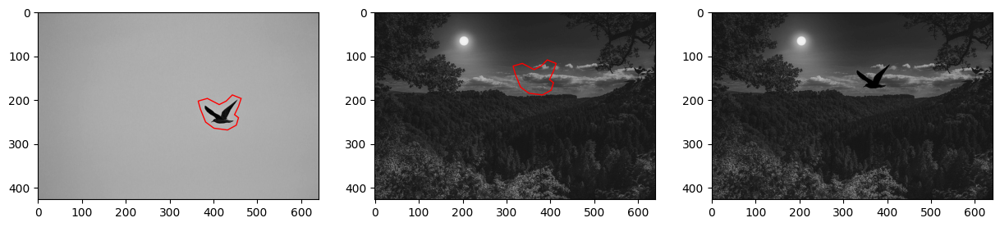

In [492]:
offset = np.array([-50, -80])
new_img_mix = mix_grad(img_source, img_target, offset, vertex)
plot_imgs_clone(img_source, img_target, new_img_mix, vertex, offset)

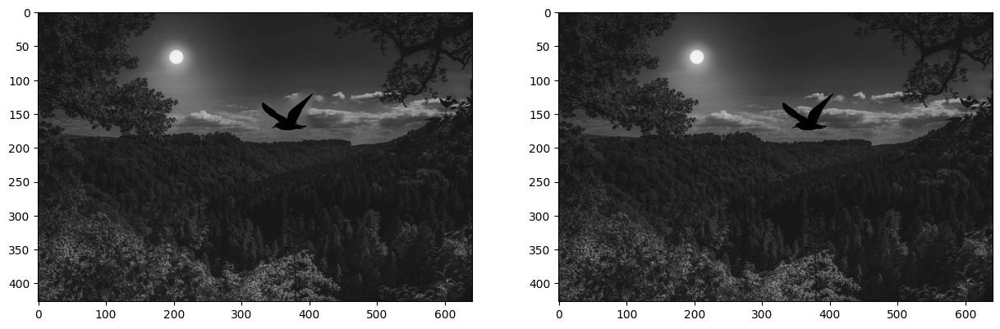

In [493]:
%matplotlib inline 
fig, ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(new_img_clone, cmap='gray', vmin=0, vmax=1)
ax[1].imshow(new_img_mix, cmap='gray', vmin=0, vmax=1)

The copied region (i.e. the bird) bleeds into the surrounding clouds in the left image with seamless cloning. The surrounding clouds are unaffected in the right image with mixed gradients.

In [10]:
raw_img = cv2.imread("img4.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_source = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_source = img_source.astype(np.float32) / 255.

raw_img = cv2.imread("img3.jpg", cv2.IMREAD_COLOR)
img_target = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_target = img_target.astype(np.float32) / 255.

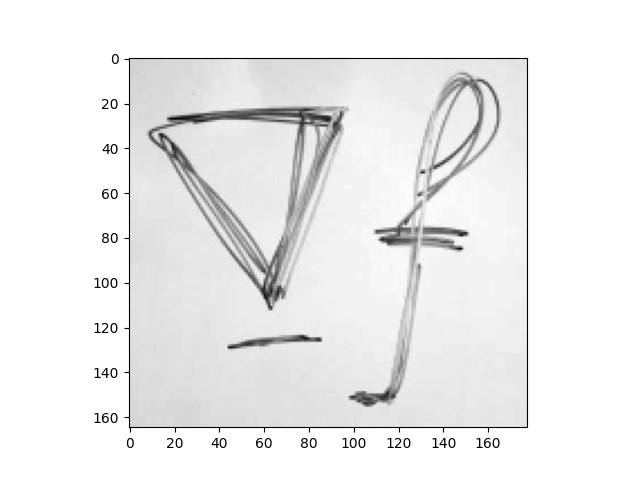

In [11]:
vertex = mark_vertices(img_source)

In [21]:
offset = np.array([100, 100])
new_img_clone = import_grad(img_source, img_target, offset, vertex)
new_img_mix = mix_grad(img_source, img_target, offset, vertex)

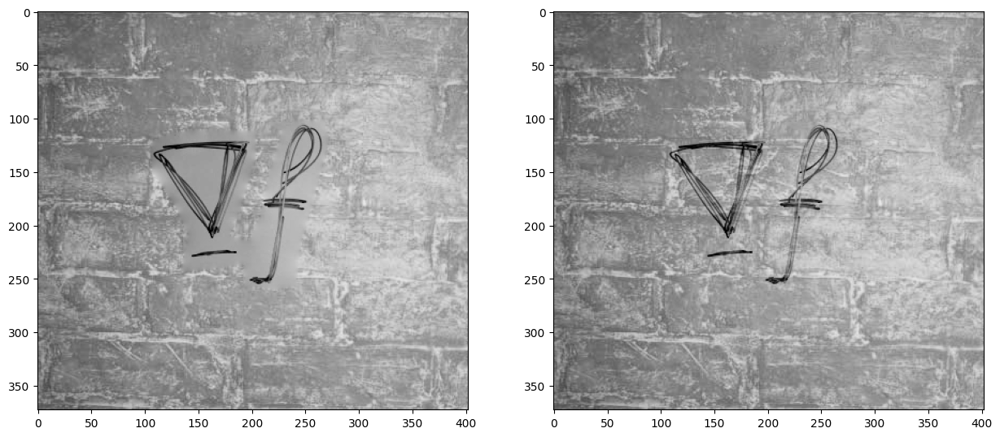

In [22]:
%matplotlib inline 
fig, ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(new_img_clone, cmap='gray', vmin=0, vmax=1)
ax[1].imshow(new_img_mix, cmap='gray', vmin=0, vmax=1)

Normal seamless cloning does not perform well when inserting objects with holes, as unnecessary portions of the copied region blurs the target image. Mixed gradients is effective at solving the problem

In [9]:
raw_img = cv2.imread("img5.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_source = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_source = img_source.astype(np.float32) / 255.

raw_img = cv2.imread("img6.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_target = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_target = img_target.astype(np.float32) / 255.

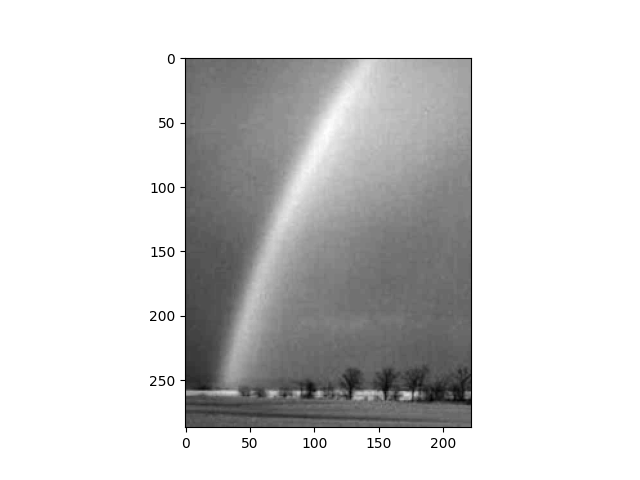

In [10]:
vertex = mark_vertices(img_source)

In [11]:
offset = np.array([0, 0])
new_img_clone = import_grad(img_source, img_target, offset, vertex)
new_img_mix = mix_grad(img_source, img_target, offset, vertex)

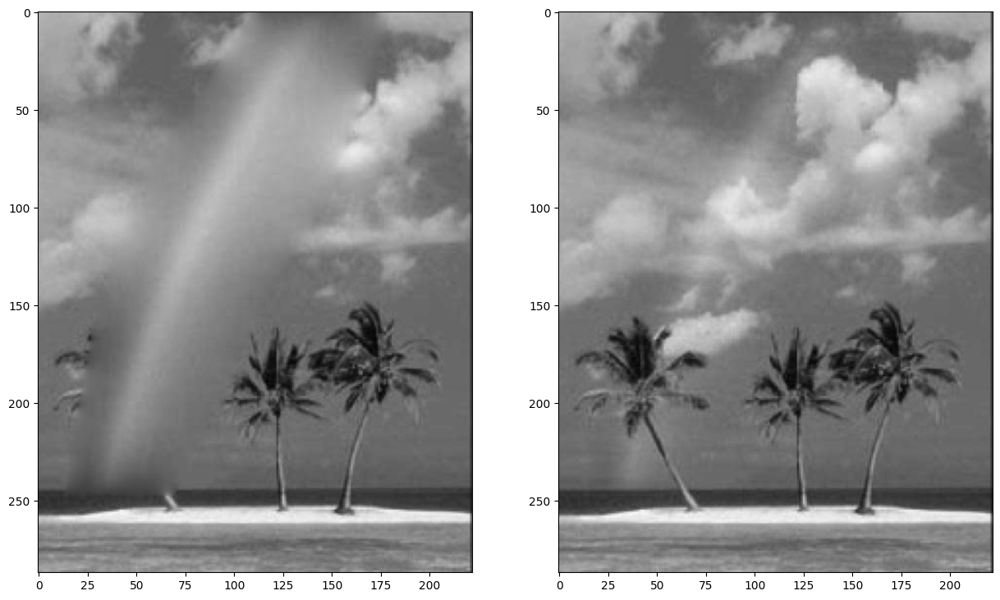

In [12]:
%matplotlib inline 
fig, ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(new_img_clone, cmap='gray', vmin=0, vmax=1)
ax[1].imshow(new_img_mix, cmap='gray', vmin=0, vmax=1)

Mixed gradients seamless cloning is also capable of copying partially transparent objects like the rainbow in the images above. While normal seamless cloning does not perform well (left), mixed gradients was able to generate an adequate result (right).

# Colored Images

In [17]:
def clone_color(source, target, vertex, offset, mode='normal'):
    channels = []
    for c in range(3):
        if mode == 'mix':
            channels.append(mix_grad(source[:,:,c], target[:,:,c], vertex, offset))
        else:
            channels.append(import_grad(source[:,:,c], target[:,:,c], vertex, offset))
    new_img_color = np.dstack(channels)
    return new_img_color

In [37]:
raw_img = cv2.imread("img2.jpg", cv2.IMREAD_COLOR)
img_source = raw_img.astype(np.float32) / 255.
img_source = img_source[...,::-1]

raw_img = cv2.imread("img.jpg", cv2.IMREAD_COLOR)
img_target = raw_img.astype(np.float32) / 255.
img_target = img_target[...,::-1]

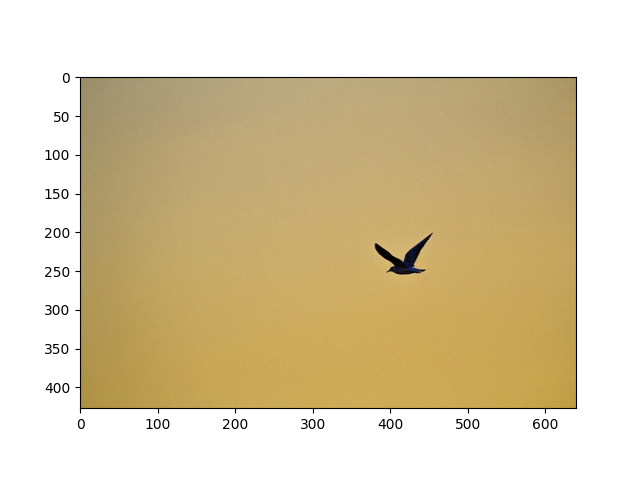

In [38]:
vertex = mark_vertices(img_source)

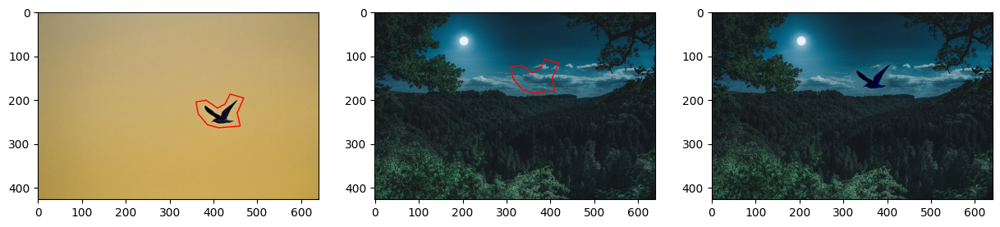

In [39]:
offset = np.array([-50, -80])
new_img_color = clone_color(img_source, img_target, offset, vertex, 'normal')
plot_imgs_clone(img_source, img_target, new_img_color, vertex, offset)

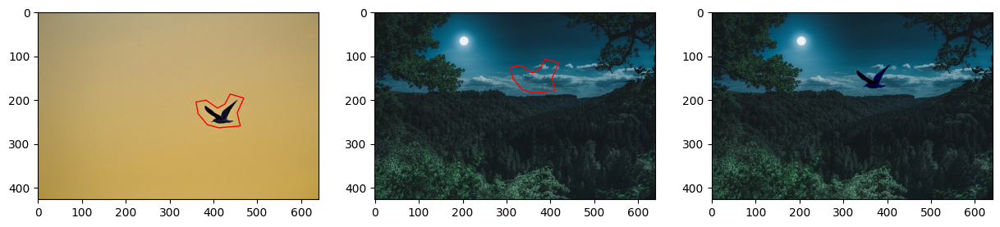

In [40]:
offset = np.array([-50, -80])
new_img_color = clone_color(img_source, img_target, offset, vertex, 'mix')
plot_imgs_clone(img_source, img_target, new_img_color, vertex, offset)

In [41]:
raw_img = cv2.imread("img4.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_source = raw_img.astype(np.float32) / 255.
img_source = img_source[...,::-1]

raw_img = cv2.imread("img3.jpg", cv2.IMREAD_COLOR)
img_target = raw_img.astype(np.float32) / 255.
img_target = img_target[...,::-1]

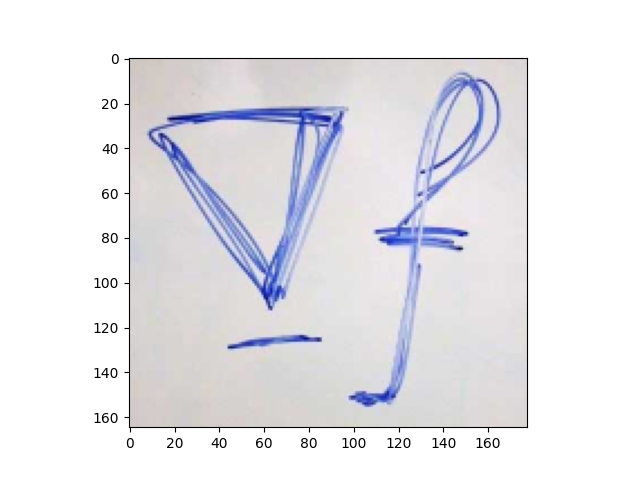

In [42]:
vertex = mark_vertices(img_source)

In [43]:
offset = np.array([100, 100])
new_img_color_import = clone_color(img_source, img_target, offset, vertex, 'normal')
new_img_color_mix = clone_color(img_source, img_target, offset, vertex, 'mix')

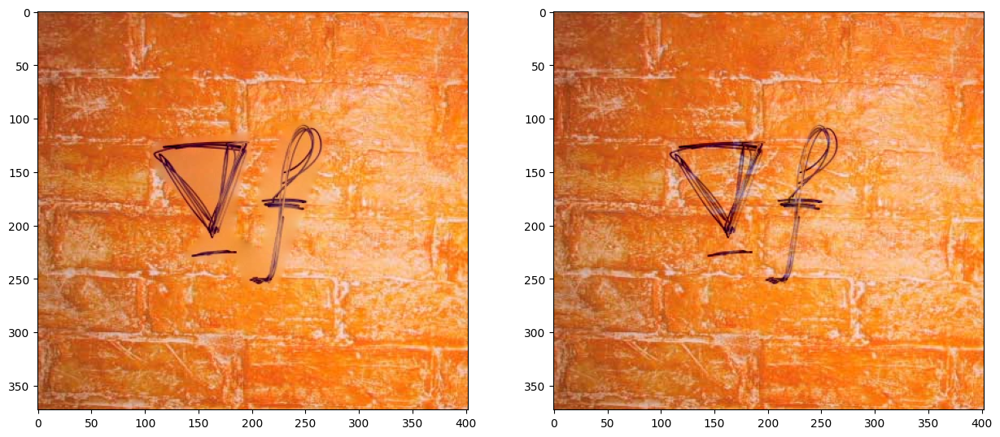

In [45]:
%matplotlib inline 
fig, ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(new_img_color_import)
ax[1].imshow(new_img_color_mix)

In [19]:
raw_img = cv2.imread("img5.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_source = raw_img.astype(np.float32) / 255.
img_source = img_source[...,::-1]

raw_img = cv2.imread("img6.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_target = raw_img.astype(np.float32) / 255.
img_target = img_target[...,::-1]

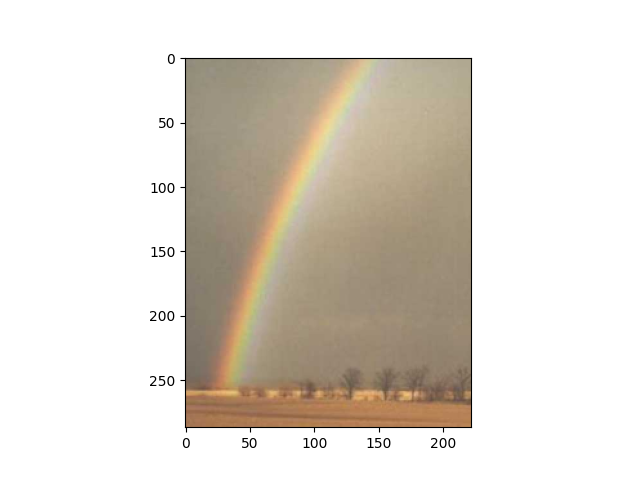

In [14]:
vertex = mark_vertices(img_source)

In [20]:
offset = np.array([0, 0])
new_img_color_import = clone_color(img_source, img_target, offset, vertex, 'normal')
new_img_color_mix = clone_color(img_source, img_target, offset, vertex, 'mix')

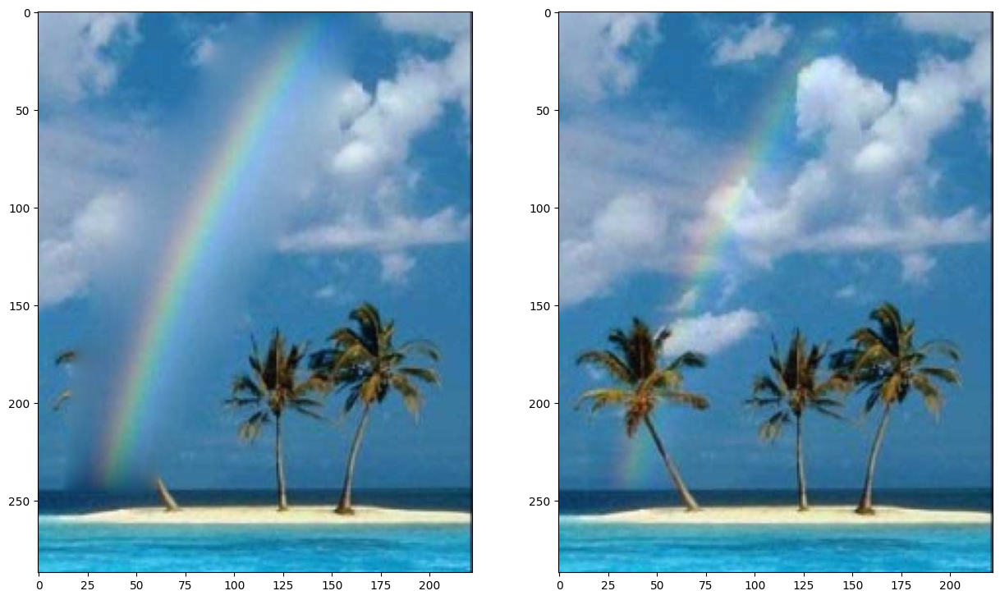

In [21]:
%matplotlib inline 
fig, ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(new_img_color_import)
ax[1].imshow(new_img_color_mix)

## Texture flattening

In [49]:
raw_img = cv2.imread("flat.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_flat_gray = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img_flat_gray = img_flat_gray.astype(np.float32) / 255.
img_flat = raw_img.astype(np.float32) / 255.
img_flat = img_flat[...,::-1]

In [51]:
def detect_edges(img_gray):
    n, d = img_gray.shape
    # sobel filter in the x direction to find vertical edges
    kernel_x = np.array([[-1,  0,  1],
                        [-2,  0,  2],
                        [-1,  0,  1]])
    # pad to img size
    kernel_x = np.pad(kernel_x, [((n-3+1)//2, (n-3)//2), ((d-3+1)//2, (d-3)//2)]) 
    G_x = np.fft.ifftshift(np.fft.ifft2(np.fft.fft2(img_gray) * np.fft.fft2(kernel_x))).real

    # sobel filter in the y direction to find horizontal edges
    kernel_y = np.array([[1,  2,  1],
                        [0,  0,  0],
                        [-1, -2, -1]])
    # pad to img size
    kernel_y = np.pad(kernel_y, [((n-3+1)//2, (n-3)//2), ((d-3+1)//2, (d-3)//2)]) 
    G_y = np.fft.ifftshift(np.fft.ifft2(np.fft.fft2(img_gray) * np.fft.fft2(kernel_y))).real

    # find magnitude then threshold
    G = np.sqrt(G_x**2 + G_y**2)
    G = (G - np.min(G)) / (np.max(G) - np.min(G))
    threshold = 0.5
    G[G < 0.05] = 0
    G[G > 0.05] = 1
    
    return G

In [52]:
def flatten(target_colored, target_gray, vertex):
    G = detect_edges(target_gray)
    
    channels = []
    # process each color channel 
    for c in range(3):
        target = target_colored[:,:,c]
        upper_lt = np.min(vertex, axis=0)
        lower_rt = np.max(vertex, axis=0)
        polygon = plt.Polygon(vertex)
        region = []
        boundary = []

        # loop over the boundary box of marked region of destination img
        for i in range(upper_lt[1], lower_rt[1]+1):
            for j in range(upper_lt[0], lower_rt[0]+1):
                # current pixel coord in destination img
                point = np.array([j, i]).reshape(2, 1)
                # four connecting neighbors of the current pixel
                n = [[j, i-1], [j, i+1], [j-1, i], [j+1, i]]

                # if pixel is inside region in the destination img
                if polygon.contains_point(point):
                    # record pixel coord of destination img
                    region.append([i, j])

                    # check each neighbor of the current pixel
                    for neighbor in n:
                        neighbor_point = np.array(neighbor).reshape(2, 1)
                        # if neighbor not in region, mark it as a boundary pixel
                        if not polygon.contains_point(neighbor_point):
                            boundary.append([neighbor[1], neighbor[0]])

        # creates a correspondence between region pixels in a 1d vector and region pixels in the img coords
        region_map = np.ones(target.shape).astype(int)
        # initialize all values to -1, if -1, then pixel not in region
        region_map = -region_map
        for idx in range(len(region)):
            i, j = region[idx]
            # image coords as key, index in 1d vector as values
            region_map[i, j] = idx

        # creates a correspondence between boundary pixels in a 1d vector and region pixels in the img coords
        boundary_map = np.ones(target.shape).astype(int)
        # initialize all values to -1, if -1, then pixel not on boundary
        boundary_map = -boundary_map
        for idx in range(len(boundary)):
            i, j = boundary[idx]
            # image coords as key, index in 1d vector as values
            boundary_map[i, j] = idx


        region = np.array(region)
        length = region.shape[0]
        A = np.zeros([length,length])
        b = np.zeros([length, 1])

        for idx in range(length):
            i, j = region[idx]
            # setting diagonals of the A matrix 
            A[idx, idx] = 4

            # four connecting neighbors of the current pixel
            neighbors = [[i, j-1], [i, j+1], [i-1, j], [i+1, j]]

            for neighbor in neighbors:
                n_i, n_j = neighbor
                # find the neighbor pixel's index in the 1d vector for region pixels
                region_idx = region_map[n_i, n_j]
                # if neighbor pixel is inside the region
                if region_idx > -1:
                    # fill in the rows of the A matrix
                    A[idx, region_idx] = -1

                boundary_idx = boundary_map[n_i, n_j]
                if boundary_idx > -1:
                    b[idx] = b[idx] + target[n_i, n_j]

                # discrete implementation for the guidance field 
                # flatten texture based on edge detector binary mask
                if G[i, j] and G[n_i, n_j]:
                    v = target[i, j] - target[n_i, n_j]
                else:
                    v = 0
                b[idx] = b[idx] + v

        # convert A to sparse matrix to speed up computation
        a = csc_matrix(A)
        # solve for unknow pixels x using Ax = b
        x = linalg.spsolve(a, b)

        # construct the new image 
        new_img = target.copy()
        counter = 0
        for pxl in region:
            i, j = pxl
            # clamp in case out of bounds
            new_img[i, j] = max(0.0, min(x[counter], 1.0))
            counter += 1

        channels.append(new_img)
    
    # combine channels
    new_img_color = np.dstack(channels)
    return new_img_color

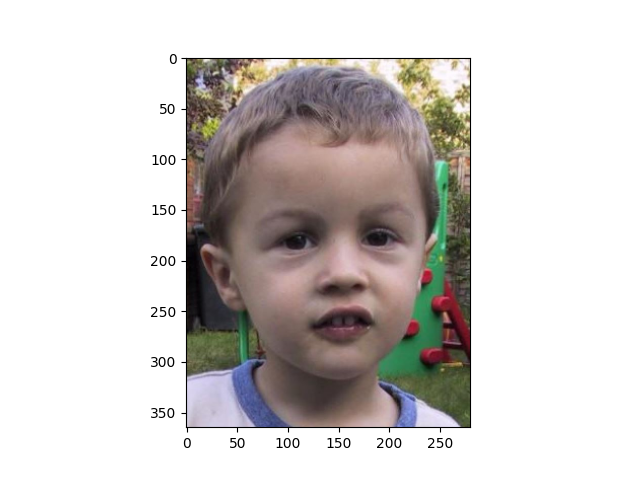

In [53]:
vertex = mark_vertices(img_flat)

In [55]:
new_img_color = flatten(img_flat, img_flat_gray, vertex)

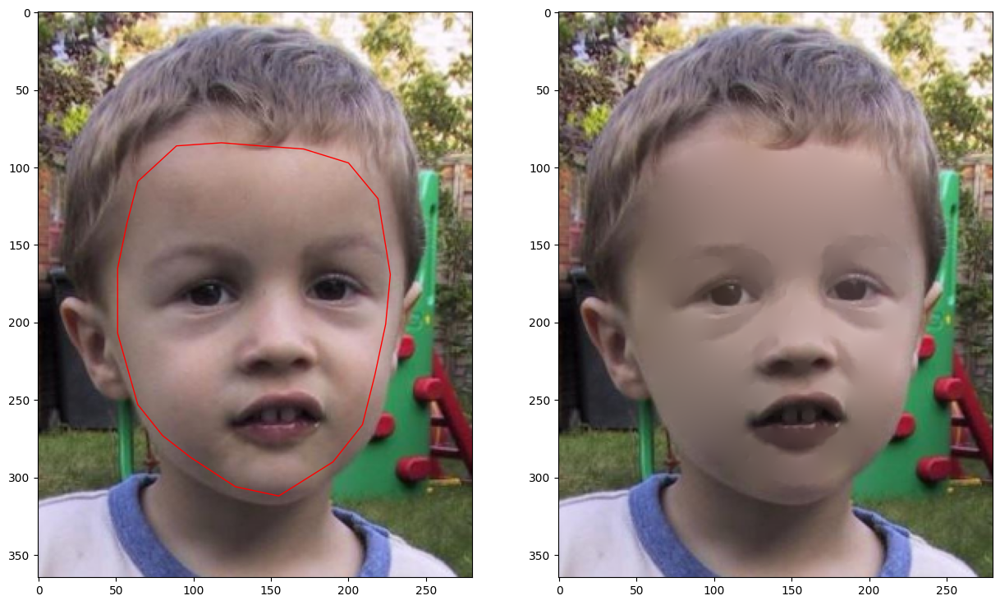

In [58]:
plot_imgs(img_flat, new_img_color, vertex)

## Local illumination changes

In [62]:
raw_img = cv2.imread("illum4.jpg", cv2.IMREAD_COLOR)
raw_img = cv2.resize(raw_img, (0,0), fx=0.5, fy=0.5) 
img_illum = raw_img.astype(np.float32) / 255.
img_illum = img_illum[...,::-1]

In [60]:
def local_illum(target_colored, vertex):
    channels = []
    # process each color channel 
    for c in range(3):
        target = target_colored[:,:,c]
        upper_lt = np.min(vertex, axis=0)
        lower_rt = np.max(vertex, axis=0)
        polygon = plt.Polygon(vertex)
        region = []
        boundary = []

        n,d = target.shape
        # handles boundary by replicating last row/column
        G_x = np.vstack((target[1:, :], target[n-1, :].reshape(1, d))) - target
        G_y = np.hstack((target[:, 1:], target[:, d-1].reshape(n, 1))) - target
        # compute gradient norm of the input img
        G = np.sqrt(G_x**2 + G_y**2)

        # record the sum of gradient norm in region
        G_sum = 0

        # loop over the boundary box of marked region of destination img
        for i in range(upper_lt[1], lower_rt[1]+1):
            for j in range(upper_lt[0], lower_rt[0]+1):
                # current pixel coord in destination img
                point = np.array([j, i]).reshape(2, 1)
                # four connecting neighbors of the current pixel
                n = [[j, i-1], [j, i+1], [j-1, i], [j+1, i]]

                # if pixel is inside region in the destination img
                if polygon.contains_point(point):
                    # record pixel coord of destination img
                    region.append([i, j])

                    # sum up gradient norms inside region
                    G_sum += G[i, j]

                    # check each neighbor of the current pixel
                    for neighbor in n:
                        neighbor_point = np.array(neighbor).reshape(2, 1)
                        # if neighbor not in region, mark it as a boundary pixel
                        if not polygon.contains_point(neighbor_point):
                            boundary.append([neighbor[1], neighbor[0]])

        # compute the average gradient norm inside the region
        G_avg = G_sum / len(region)

        # creates a correspondence between region pixels in a 1d vector and region pixels in the img coords
        region_map = np.ones(target.shape).astype(int)
        # initialize all values to -1, if -1, then pixel not in region
        region_map = -region_map
        for idx in range(len(region)):
            i, j = region[idx]
            # image coords as key, index in 1d vector as values
            region_map[i, j] = idx

        # creates a correspondence between boundary pixels in a 1d vector and region pixels in the img coords
        boundary_map = np.ones(target.shape).astype(int)
        # initialize all values to -1, if -1, then pixel not on boundary
        boundary_map = -boundary_map
        for idx in range(len(boundary)):
            i, j = boundary[idx]
            # image coords as key, index in 1d vector as values
            boundary_map[i, j] = idx

        region = np.array(region)
        length = region.shape[0]
        A = np.zeros([length,length])
        b = np.zeros([length, 1])    

        # compute alpha
        alpha = 0.05 * G_avg
        # compute beta
        beta = 0.3

        for idx in range(length):
            i, j = region[idx]
            # setting diagonals of the A matrix 
            A[idx, idx] = 4

            # four connecting neighbors of the current pixel
            neighbors = [[i, j-1], [i, j+1], [i-1, j], [i+1, j]]

            for neighbor in neighbors:
                n_i, n_j = neighbor
                # find the neighbor pixel's index in the 1d vector for region pixels
                region_idx = region_map[n_i, n_j]
                # if neighbor pixel is inside the region
                if region_idx > -1:
                    # fill in the rows of the A matrix
                    A[idx, region_idx] = -1

                boundary_idx = boundary_map[n_i, n_j]
                if boundary_idx > -1:
                    b[idx] = b[idx] + target[n_i, n_j]

                # discrete implementation for the guidance field 
                grad = target[i, j] - target[n_i, n_j]
                if grad != 0:
                    v = (alpha**beta) * (abs(grad)**(-beta)) * grad
                else:
                    v = 0
                b[idx] = b[idx] + v

        # convert A to sparse matrix to speed up computation
        a = csc_matrix(A)
        # solve for unknow pixels x using Ax = b
        x = linalg.spsolve(a, b)

        # construct the new image 
        new_img = target.copy()
        counter = 0
        for pxl in region:
            i, j = pxl
            # clamp in case out of bounds
            new_img[i, j] = max(0.0, min(x[counter], 1.0))
            counter += 1
        
        channels.append(new_img)
    
    # combine channels
    new_img_color = np.dstack(channels)
    return new_img_color

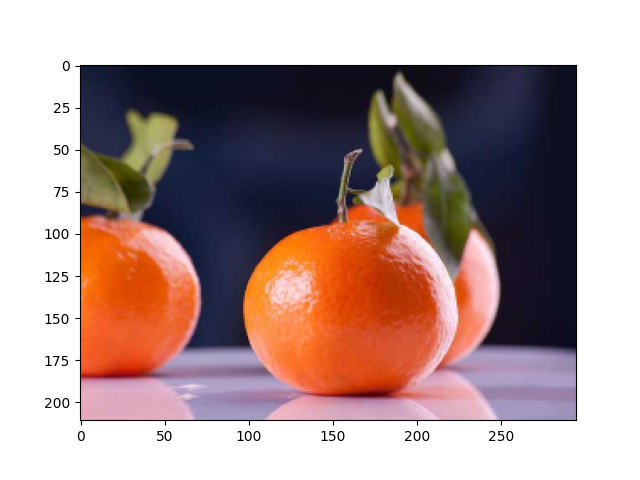

In [67]:
vertex = mark_vertices(img_illum)

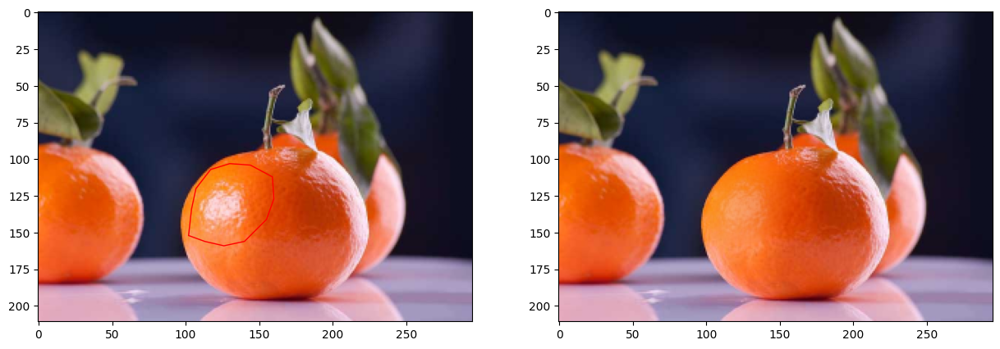

In [68]:
new_img_color = local_illum(img_illum, vertex)
plot_imgs(img_illum, new_img_color, vertex)